<a href="https://colab.research.google.com/github/LeoTU911/SCC413/blob/main/convVAE_3_0_epoch100.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Wed Mar  1 00:28:48 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    23W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [1]:
!git clone https://github.com/LeoTU911/SCC413

Cloning into 'SCC413'...
remote: Enumerating objects: 758, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 758 (delta 10), reused 10 (delta 3), pack-reused 732
Receiving objects: 100% (758/758), 70.50 MiB | 12.91 MiB/s, done.
Resolving deltas: 100% (112/112), done.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!rm -rf /content/SCC413
#!ls -R
#!rm -rf /content/SCC413/Keras_convVAE_dataset/generate/generated/*

In [3]:
import os
import tensorflow as tf
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import keras
import cv2
from keras import backend as K
from keras import losses
from keras.layers import Input, Dense, Lambda, Flatten, Reshape
from keras.layers import Conv2D, Conv2DTranspose, Cropping2D, Dropout
from keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Concatenate, MaxPooling2D, Activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from PIL import Image

In [4]:
def imageGeneration1(image, image_path, image_name, iterations):
  image_horizontal = cv2.flip(image, 1)
  names = image_name.split('.')
  fileName = names[0] + '_horizontal' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_horizontal)

def imageGeneration2(image, image_path, image_name, iterations):
  image_vertical = cv2.flip(image, -1)
  names = image_name.split('.')
  fileName = names[0] + '_vertical' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_vertical)

def imageGeneration3(image, image_path, image_name, iterations):
  image_HorVer_tmp = cv2.flip(image, 1)
  image_HorVer = cv2.flip(image_HorVer_tmp, -1)
  names = image_name.split('.')
  fileName = names[0] + '_HorVer' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_HorVer)

def imageGeneration4(image, image_path, image_name, iterations):
  image_VerHor_tmp = cv2.flip(image, -1)
  image_VerHor = cv2.flip(image_VerHor_tmp, 1)
  names = image_name.split('.')
  fileName = names[0] + '_VerHor' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_VerHor)

def imageGeneration5(image, image_path, image_name, iterations):
  image_rotate1 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
  names = image_name.split('.')
  fileName = names[0] + '_rotate1' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_rotate1) 

def imageGeneration6(image, image_path, image_name, iterations):
  image_rotate2 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
  names = image_name.split('.')
  fileName = names[0] + '_rotate2' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_rotate2)

def imageGenerationMain(filePath, n_imgGenerate):
  fileNames = list(os.listdir(filePath))
  for i in range(n_imgGenerate):
    for j in range(len(fileNames)):
      fileName = fileNames[j]
      image = cv2.imread(os.path.join(filePath, fileName))
      imageGeneration1(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration2(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration3(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration4(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration5(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration6(image, image_path = filePath, image_name = fileName, iterations = i)
    print('Image generated, times: ', i+1)
  return True

In [5]:
filePath1 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
filePath2 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_sketches'
# every generation will create 6*N photos
# for example, N = 88, 4 loops will create 4*6*88+88(origin) = 2200 images
n_imgGenerate = 4

imageGenerationMain(filePath1, n_imgGenerate)

Image generated, times:  1
Image generated, times:  2
Image generated, times:  3
Image generated, times:  4


True

In [6]:
imageGenerationMain(filePath2, n_imgGenerate)

Image generated, times:  1
Image generated, times:  2
Image generated, times:  3
Image generated, times:  4


True

In [7]:
print(len(os.listdir(filePath1)))
print(len(os.listdir(filePath2)))

2200
2200


In [8]:
#image to grayscale image
filePath1 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
filePath2 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_sketches'
filePath3 = '/content/SCC413/Keras_convVAE_dataset/CUHK_testing_cropped_photos'


def img2GSimg(filePath):
  images = []

  for fileName in os.listdir(filePath):
    if fileName.endswith('.jpg'):
      img_tmp = Image.open(os.path.join(filePath, fileName)).convert('L')
      img_tmp = img_tmp.resize((128, 128))
      img_array = np.array(img_tmp)
      images.append(img_array)
  return images

images  = img2GSimg(filePath1)
images2 = img2GSimg(filePath2)
images3 = img2GSimg(filePath3)

x_train = np.array(images).reshape((-1, 128, 128, 1)).astype('float32') / 255.
y_train = np.array(images2).reshape((-1, 128, 128, 1)).astype('float32') / 255.
x_test = np.array(images3).reshape((-1, 128, 128, 1)).astype('float32') / 255.

In [9]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)

(2200, 128, 128, 1)
(2200, 128, 128, 1)
(100, 128, 128, 1)


In [24]:
input_shape = (128, 128, 1)
batch_size = 32
latent_dim = 128
encoder_layers = [64, 128, 256, 512]
decoder_layers = [64, 128, 128, 256, 256, 512, 512]

def sampling(args):
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim),
                              mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

# 编码器
inputs = Input(shape=input_shape)
x = inputs
for filters in encoder_layers:
    x = Conv2D(filters, kernel_size=3, strides=2, activation='LeakyReLU', padding='same')(x)
    x = BatchNormalization(axis=1)(x)
    x = MaxPooling2D(padding='same')(x)
shape_before_flattening = x.shape[1:]
x = Flatten()(x)
x = Dense(latent_dim, activation='LeakyReLU')(x)

z_mean = Dense(latent_dim, name='z_mean')(x)
z_log_var = Dense(latent_dim, name='z_log_var')(x)
z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

encoder = Model(inputs, [z_mean, z_log_var], name='encoder')

# 解码器
latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
x = Dense(np.prod(shape_before_flattening))(latent_inputs)
x = Reshape(shape_before_flattening)(x)
for filters in decoder_layers:
    x = Conv2DTranspose(filters, kernel_size=3, strides=(2,2), activation='LeakyReLU', padding='same')(x)
x = Conv2DTranspose(1, kernel_size=3, activation='sigmoid', padding='same')(x)
decoder = Model(latent_inputs, x, name='decoder')

encoder.summary()
decoder.summary()

# VAE模型
reconstruction = decoder(z)
vae = Model(inputs, reconstruction, name='vae')

# 计算损失函数
reconstruction_loss = K.mean(K.binary_crossentropy(K.flatten(inputs), K.flatten(reconstruction)))
reconstruction_loss *= input_shape[0] * input_shape[1]
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)
vae.add_loss(vae_loss)

# 编译模型
vae.compile(optimizer='adam')

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 64, 64, 64)   640         ['input_2[0][0]']                
                                                                                                  
 batch_normalization_4 (BatchNo  (None, 64, 64, 64)  256         ['conv2d_4[0][0]']               
 rmalization)                                                                                     
                                                                                            

In [35]:
from keras.models import load_model

model_Path = '/content/model_47.h5'
preTrained_VAE = load_model(model_Path)

# 编译模型
preTrained_VAE.compile(optimizer='adam')

Epoch 1/50
62/62 [==============================] - 57s 813ms/step - loss: 8819.9541 - val_loss: 8825.9014
Epoch 2/50
62/62 [==============================] - 52s 838ms/step - loss: 8777.2764 - val_loss: 8815.1494
Epoch 3/50
62/62 [==============================] - 53s 849ms/step - loss: 8763.0664 - val_loss: 8817.2568
Epoch 4/50
62/62 [==============================] - 54s 868ms/step - loss: 8758.3516 - val_loss: 8807.8359
Epoch 5/50
62/62 [==============================] - 54s 880ms/step - loss: 8758.8291 - val_loss: 8808.0537
Epoch 6/50
62/62 [==============================] - 55s 894ms/step - loss: 8758.2109 - val_loss: 8807.2783
Epoch 7/50
62/62 [==============================] - 56s 900ms/step - loss: 8757.6729 - val_loss: 8803.5898
Epoch 8/50
62/62 [==============================] - 56s 900ms/step - loss: 8752.2754 - val_loss: 8805.7852
Epoch 9/50
62/62 [==============================] - 56s 904ms/step - loss: 8749.1201 - val_loss: 8798.8799
Epoch 10/50
62/62 [==================

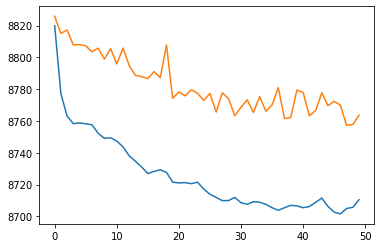

In [36]:
# 训练模型
checkPointSavedModelName = 'model_{epoch:02d}.h5'
checkPoint = ModelCheckpoint(
    filepath=checkPointSavedModelName,
    monitor='val_loss', 
    save_best_only=True)

#vae.fit(x_train, 
#    y_train,
#    epochs=50,
#    batch_size=batch_size,
#    shuffle=False,
#    validation_split=0.1,
#    callbacks=[checkPoint]
#    )

## plot
#plt.plot(vae.history.history["loss"])
#plt.plot(vae.history.history["val_loss"])

# pre-Trained Model continue training
preTrained_VAE.fit(x_train, 
    y_train,
    epochs=50,
    batch_size=batch_size,
    shuffle=False,
    validation_split=0.1,
    callbacks=[checkPoint]
    )

# plot
plt.plot(preTrained_VAE.history.history["loss"])
plt.plot(preTrained_VAE.history.history["val_loss"])

In [14]:
# save model
vae.save('vae_model_4.0_Latent_Dim128_Epochs50')

In [15]:
cp -r /content/vae_model_4.0_Latent_Dim128_Epochs50/ /content/drive/MyDrive/

In [33]:
#mv /content/model_47.h5 /content/model_47_Latent_Dim128_Epochs50.h5
cp /content/model_47.h5 /content/drive/MyDrive

NameError: ignored

In [30]:
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

def imgPredictionEvaluate(realImg, predictImg):

  img_array_real  = img_as_float(realImg)
  img_array_predict = img_as_float(predictImg)

  mse_2img = mean_squared_error(img_array_real, img_array_predict)
  ssim_2img = ssim(img_array_real, img_array_predict,
                    data_range=img_array_predict.max() - img_array_predict.min())

  evaluations = [round(mse_2img, 4), round(ssim_2img, 4)]
  return evaluations

1/1 [==============================] - 0s 341ms/step


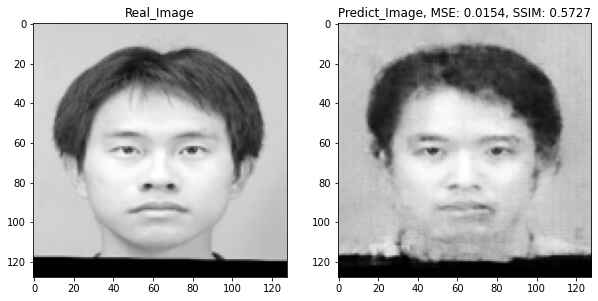

1/1 [==============================] - 0s 23ms/step


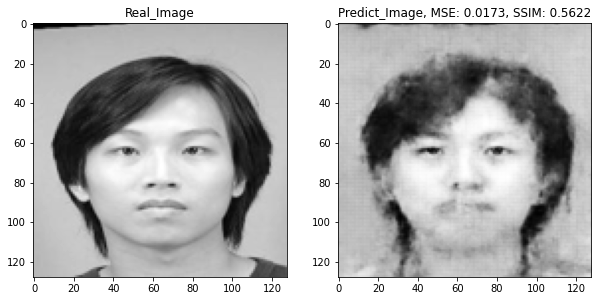

1/1 [==============================] - 0s 22ms/step


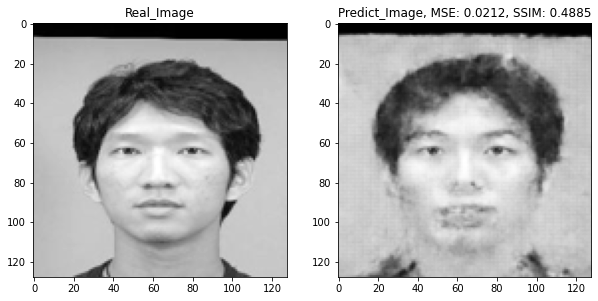

1/1 [==============================] - 0s 23ms/step


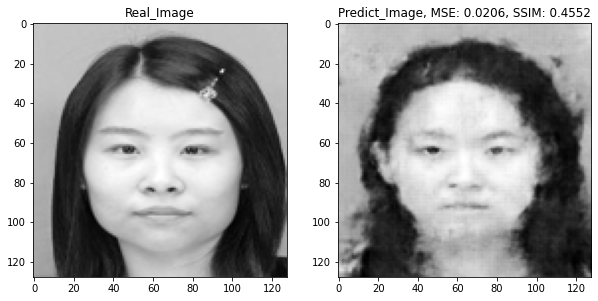

1/1 [==============================] - 0s 22ms/step


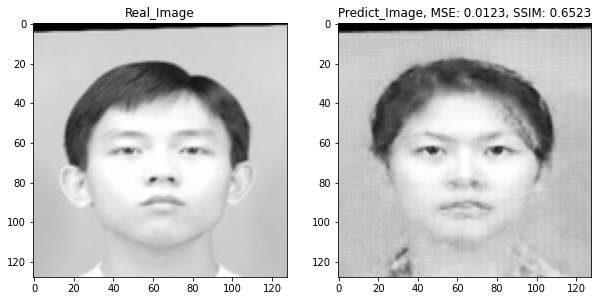

1/1 [==============================] - 0s 24ms/step


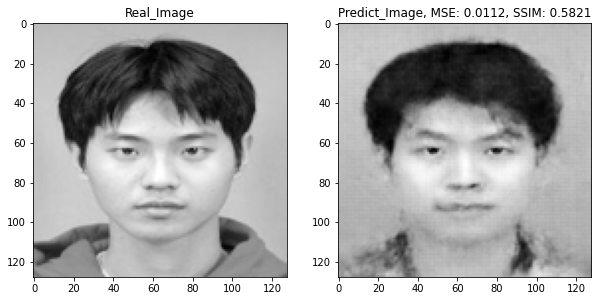

1/1 [==============================] - 0s 25ms/step


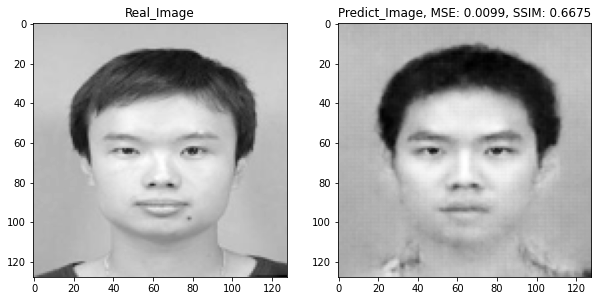

1/1 [==============================] - 0s 23ms/step


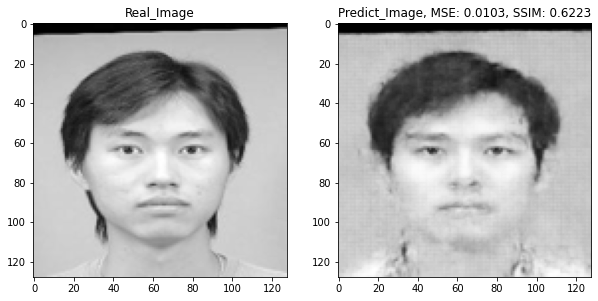

1/1 [==============================] - 0s 21ms/step


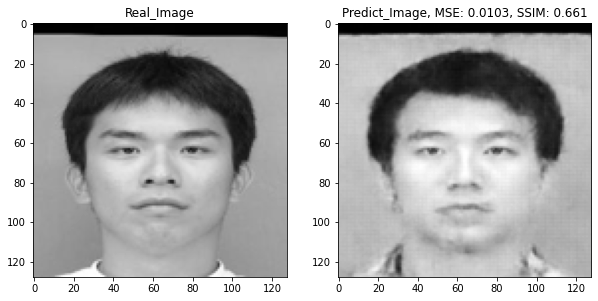

1/1 [==============================] - 0s 20ms/step


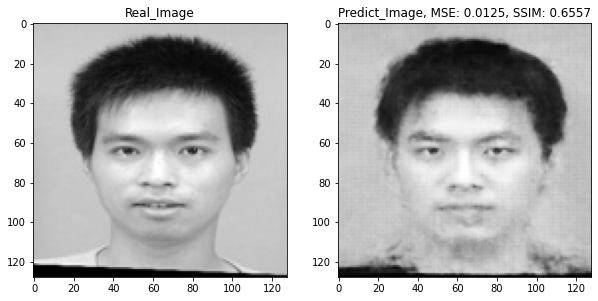

1/1 [==============================] - 0s 21ms/step


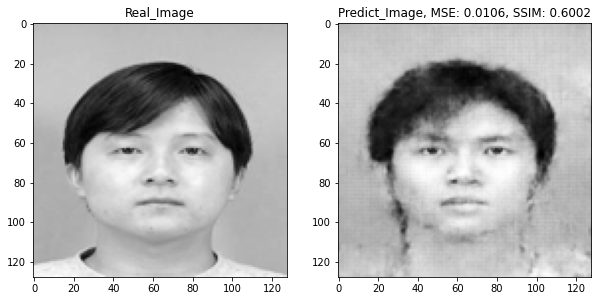

1/1 [==============================] - 0s 20ms/step


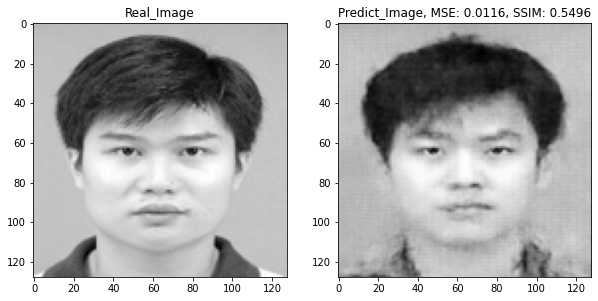

1/1 [==============================] - 0s 21ms/step


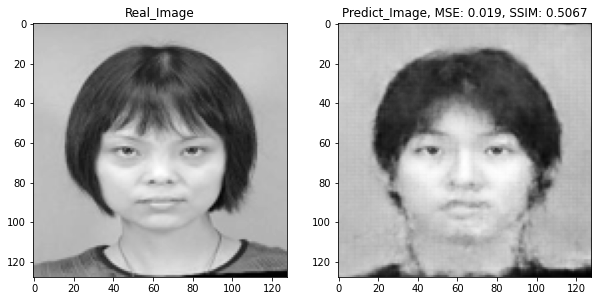

1/1 [==============================] - 0s 20ms/step


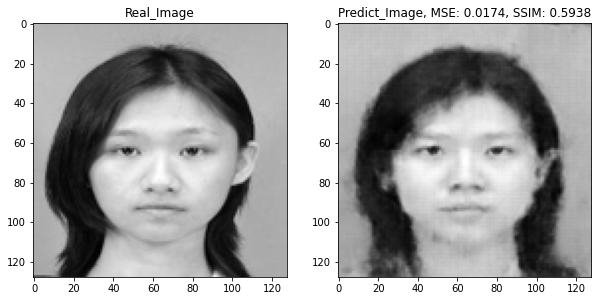

1/1 [==============================] - 0s 24ms/step


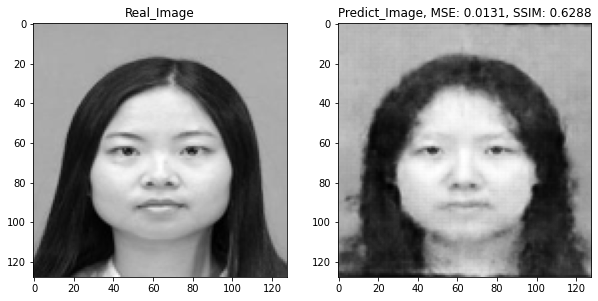

1/1 [==============================] - 0s 22ms/step


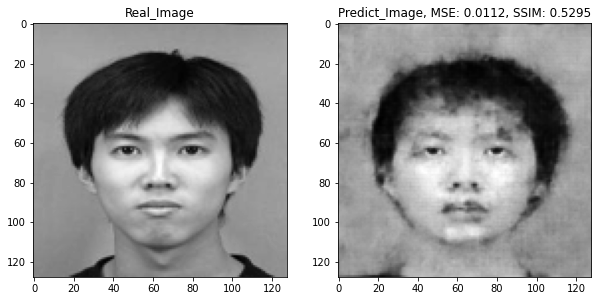

1/1 [==============================] - 0s 21ms/step


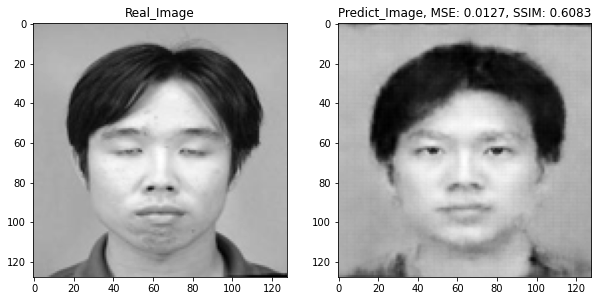

1/1 [==============================] - 0s 20ms/step


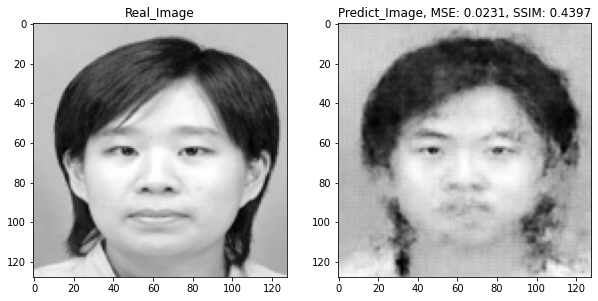

1/1 [==============================] - 0s 20ms/step


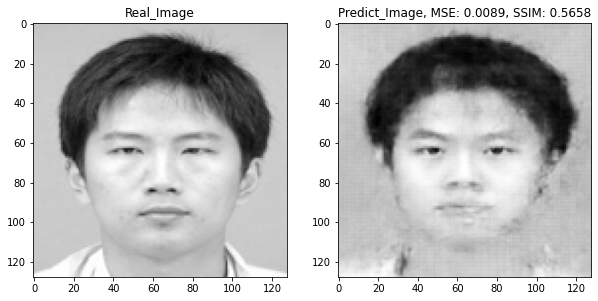

1/1 [==============================] - 0s 21ms/step


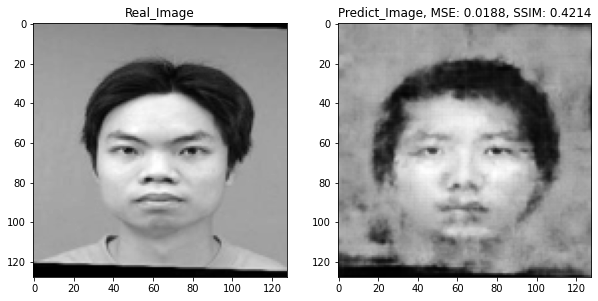

1/1 [==============================] - 0s 20ms/step


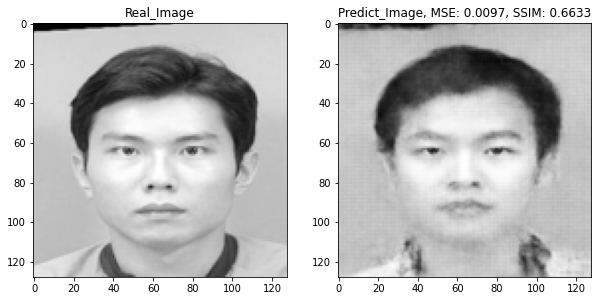

1/1 [==============================] - 0s 22ms/step


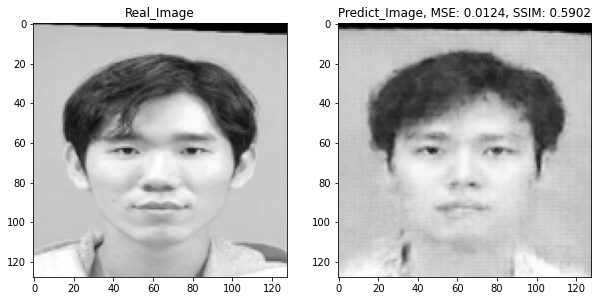

1/1 [==============================] - 0s 22ms/step


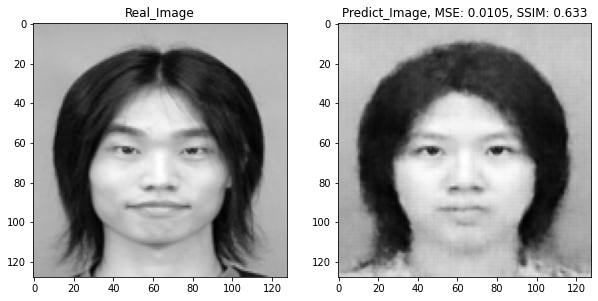

1/1 [==============================] - 0s 23ms/step


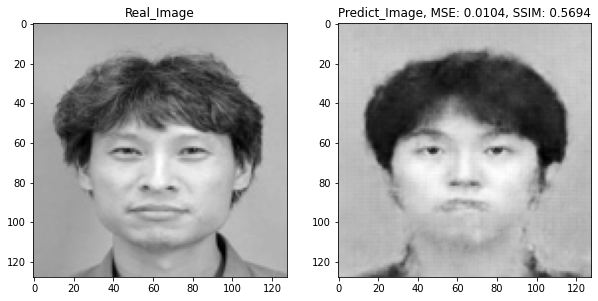

1/1 [==============================] - 0s 21ms/step


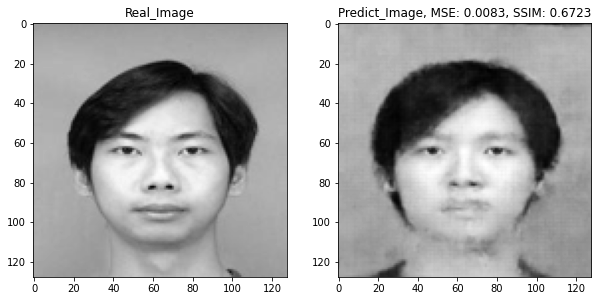

1/1 [==============================] - 0s 22ms/step


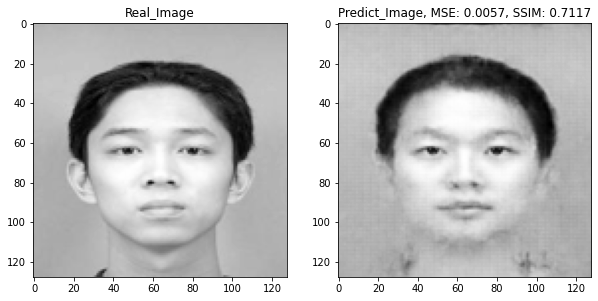

1/1 [==============================] - 0s 21ms/step


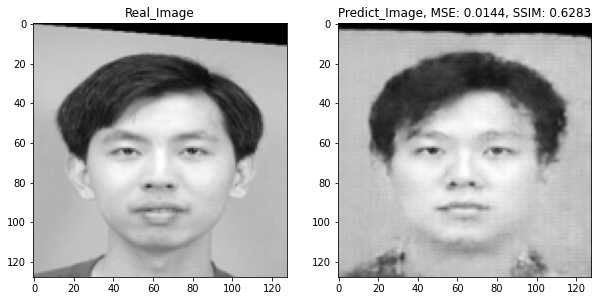

1/1 [==============================] - 0s 21ms/step


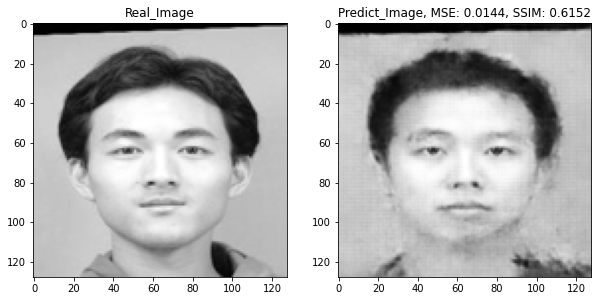

1/1 [==============================] - 0s 21ms/step


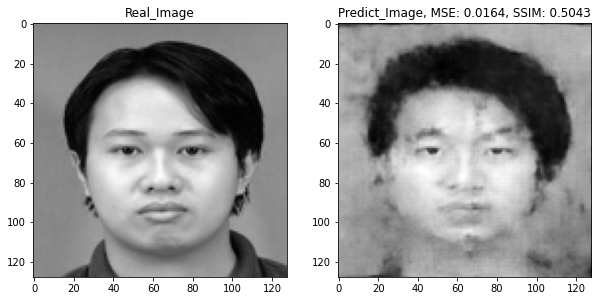

1/1 [==============================] - 0s 20ms/step


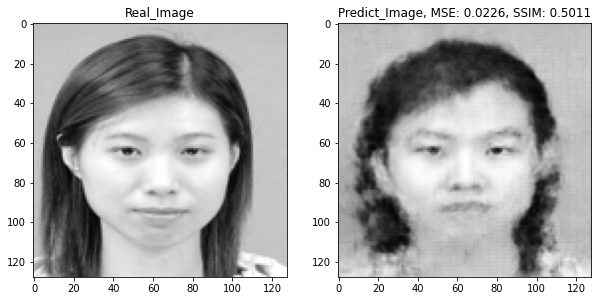

1/1 [==============================] - 0s 21ms/step


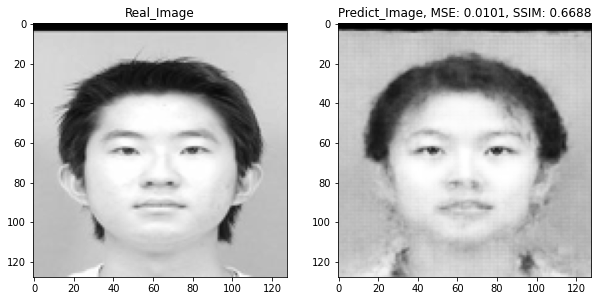

1/1 [==============================] - 0s 21ms/step


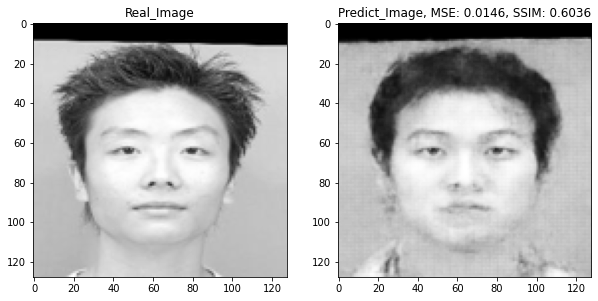

1/1 [==============================] - 0s 21ms/step


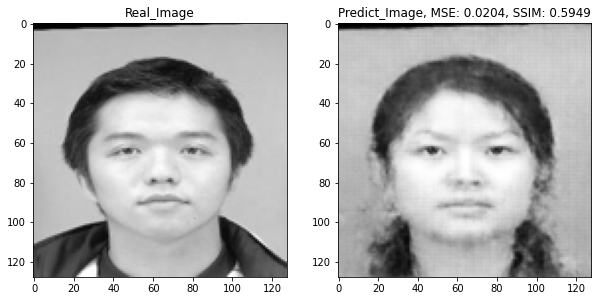

1/1 [==============================] - 0s 21ms/step


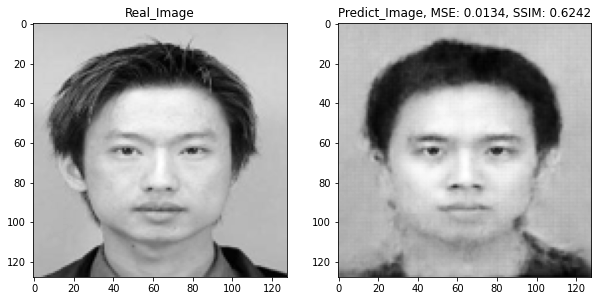

1/1 [==============================] - 0s 27ms/step


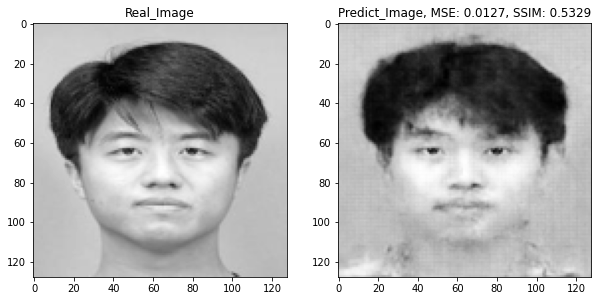

1/1 [==============================] - 0s 24ms/step


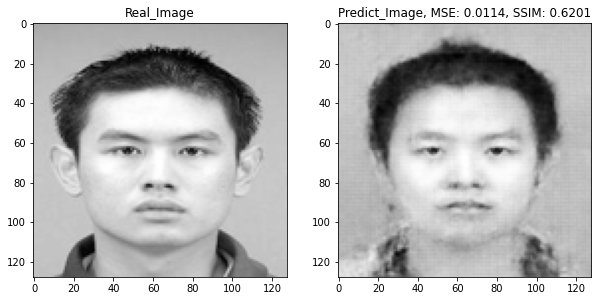

1/1 [==============================] - 0s 22ms/step


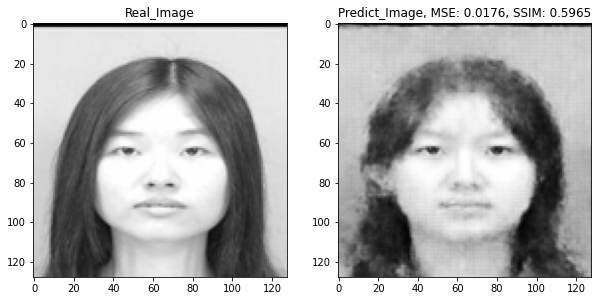

1/1 [==============================] - 0s 26ms/step


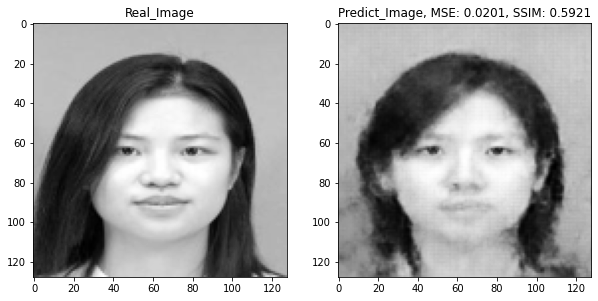

1/1 [==============================] - 0s 22ms/step


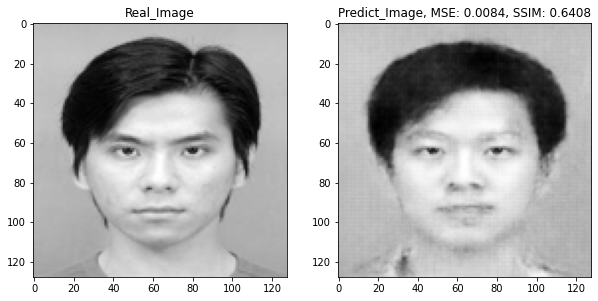

1/1 [==============================] - 0s 22ms/step


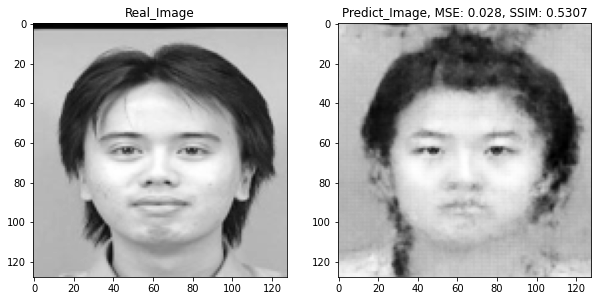

1/1 [==============================] - 0s 25ms/step


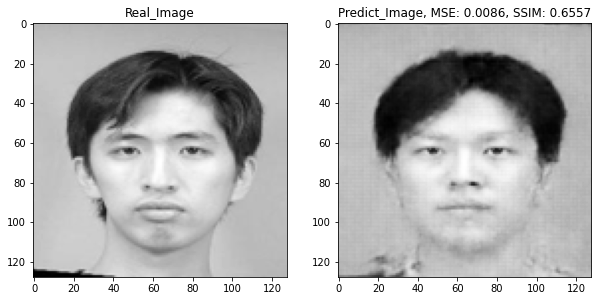

1/1 [==============================] - 0s 22ms/step


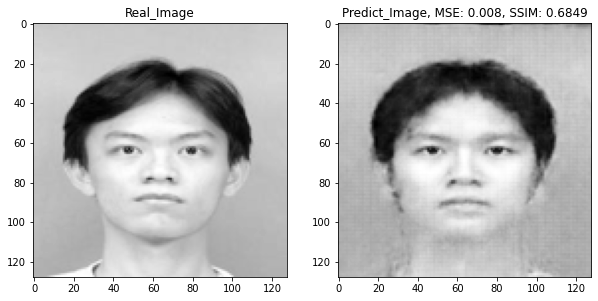

1/1 [==============================] - 0s 27ms/step


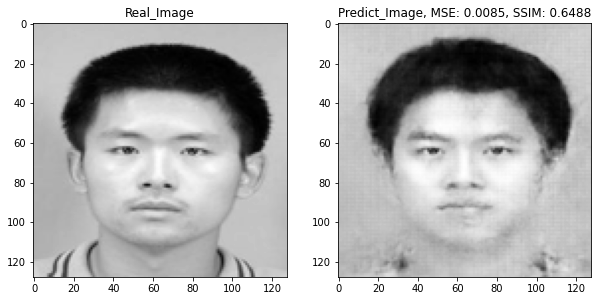

1/1 [==============================] - 0s 23ms/step


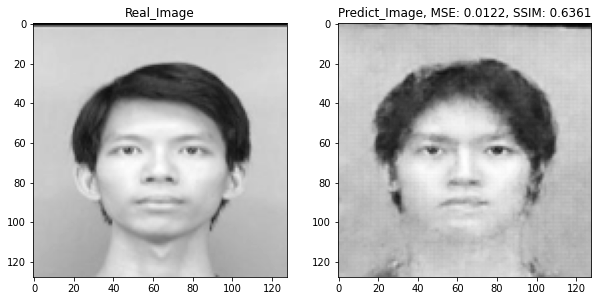

1/1 [==============================] - 0s 22ms/step


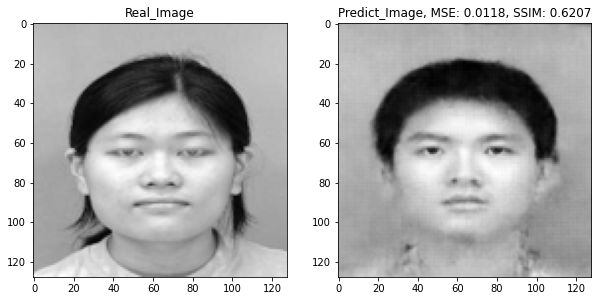

1/1 [==============================] - 0s 21ms/step


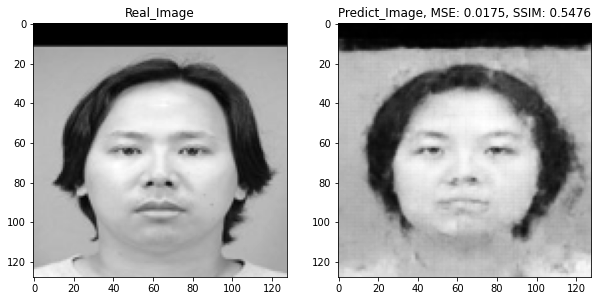

1/1 [==============================] - 0s 21ms/step


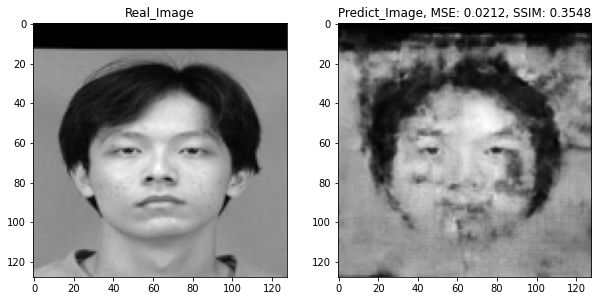

1/1 [==============================] - 0s 21ms/step


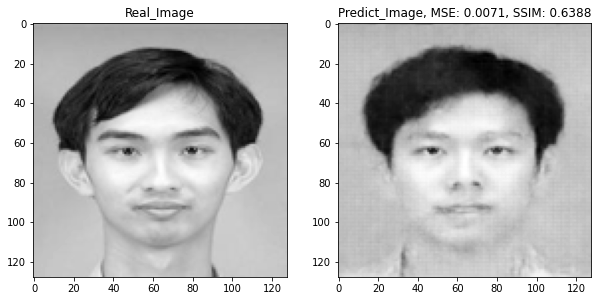

1/1 [==============================] - 0s 21ms/step


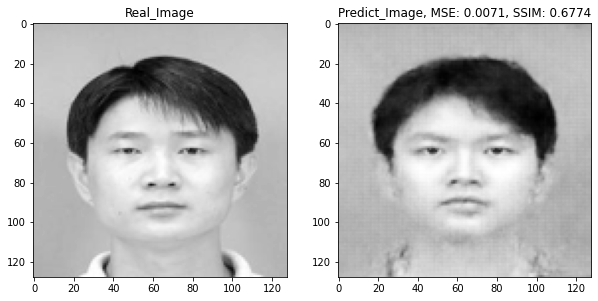

1/1 [==============================] - 0s 21ms/step


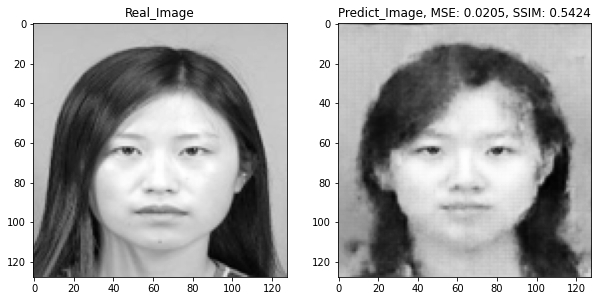

1/1 [==============================] - 0s 25ms/step


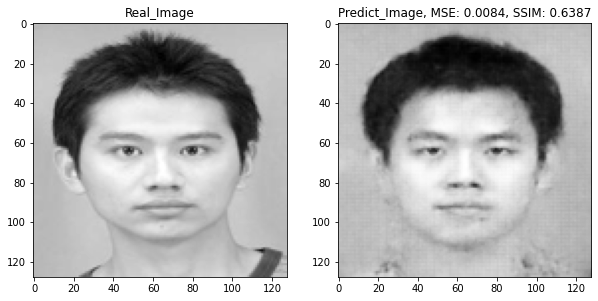

1/1 [==============================] - 0s 21ms/step


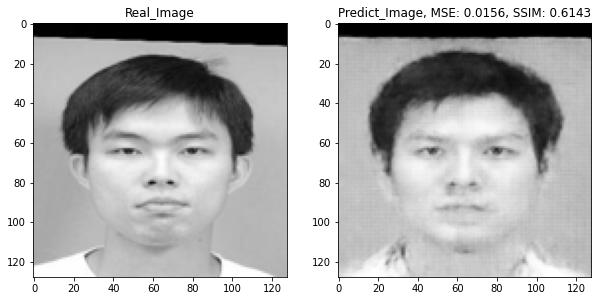

1/1 [==============================] - 0s 21ms/step


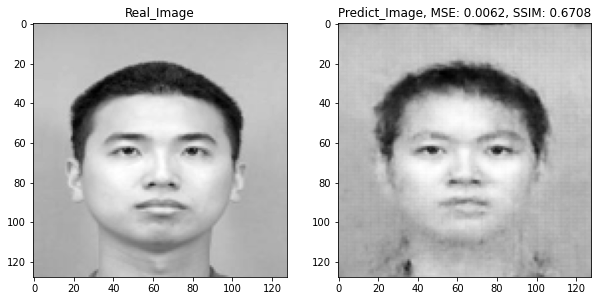

1/1 [==============================] - 0s 23ms/step


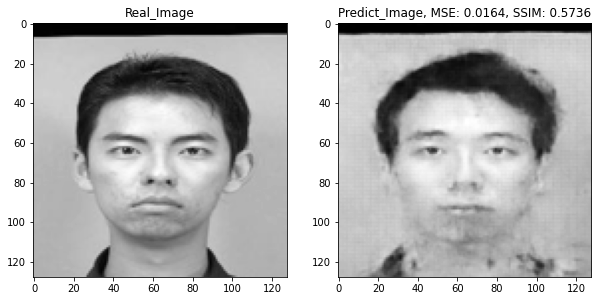

1/1 [==============================] - 0s 22ms/step


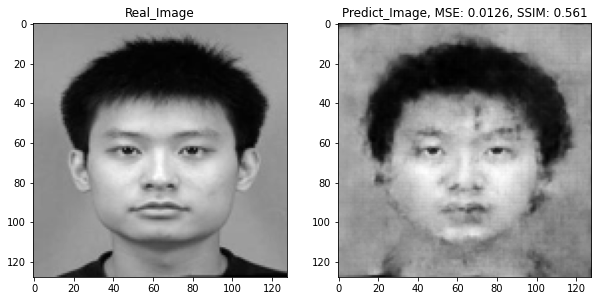

1/1 [==============================] - 0s 21ms/step


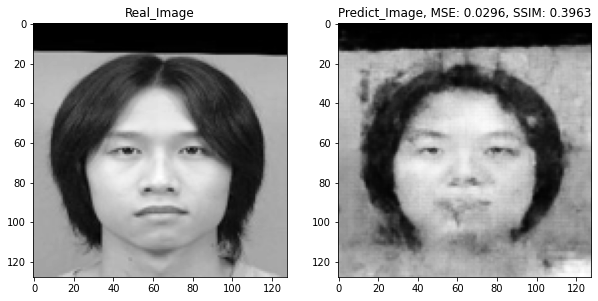

1/1 [==============================] - 0s 21ms/step


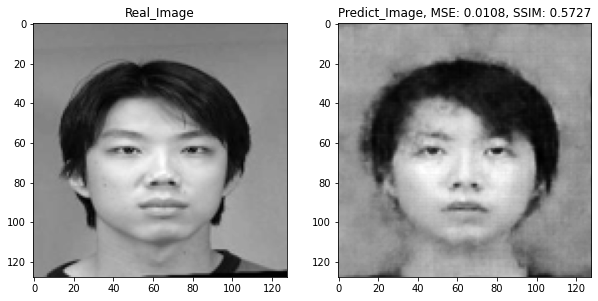

1/1 [==============================] - 0s 23ms/step


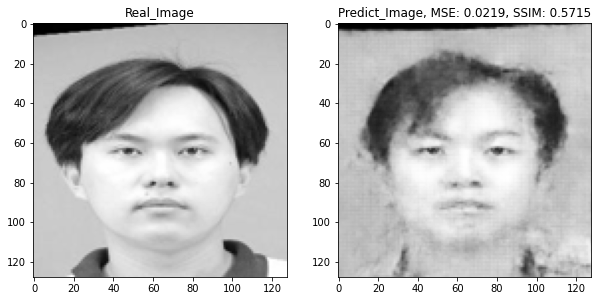

1/1 [==============================] - 0s 22ms/step


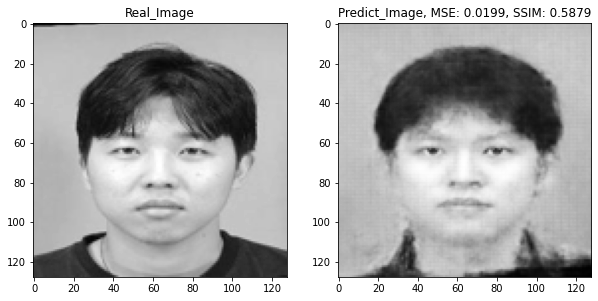

1/1 [==============================] - 0s 23ms/step


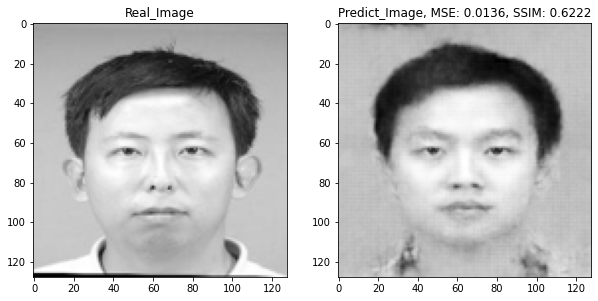

1/1 [==============================] - 0s 21ms/step


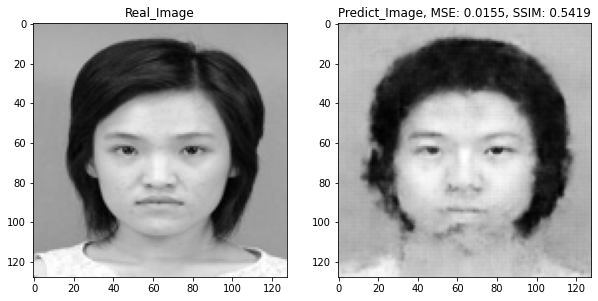

1/1 [==============================] - 0s 23ms/step


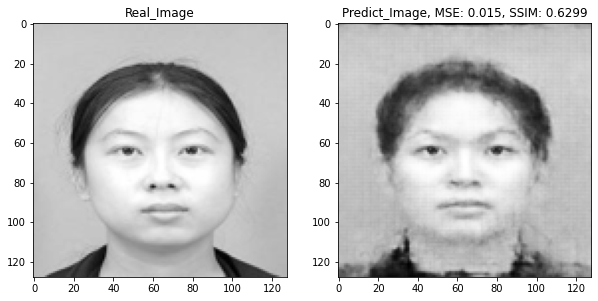

1/1 [==============================] - 0s 32ms/step


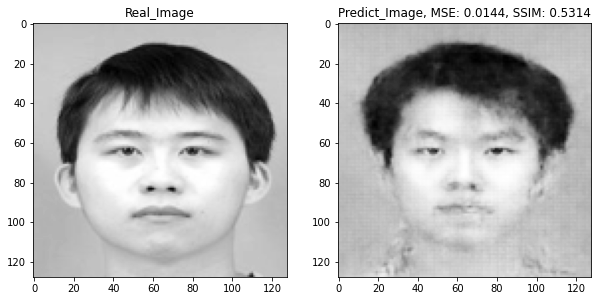

1/1 [==============================] - 0s 27ms/step


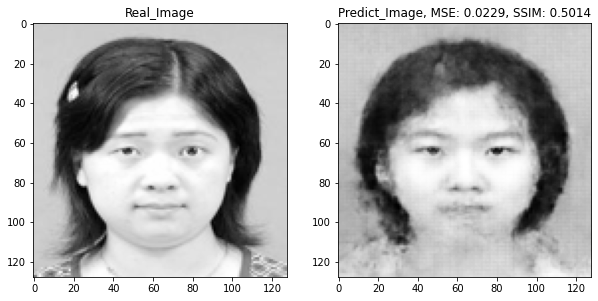

1/1 [==============================] - 0s 21ms/step


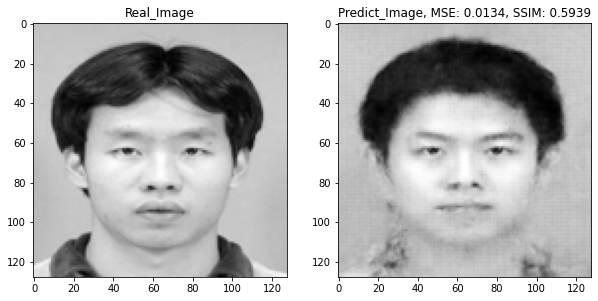

1/1 [==============================] - 0s 30ms/step


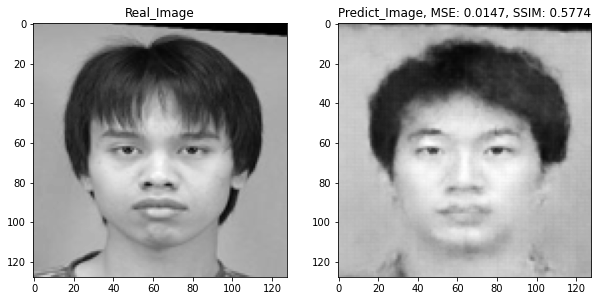

1/1 [==============================] - 0s 22ms/step


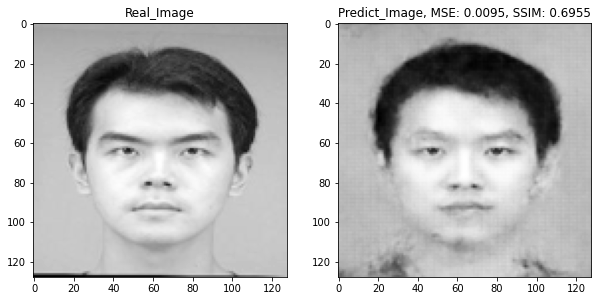

1/1 [==============================] - 0s 21ms/step


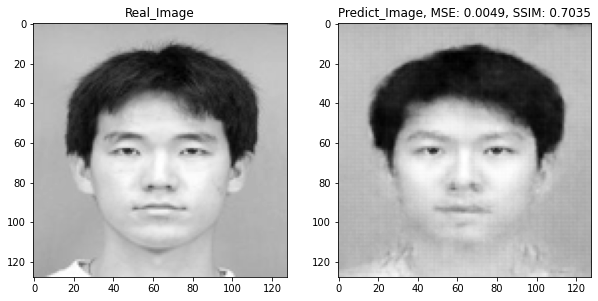

1/1 [==============================] - 0s 22ms/step


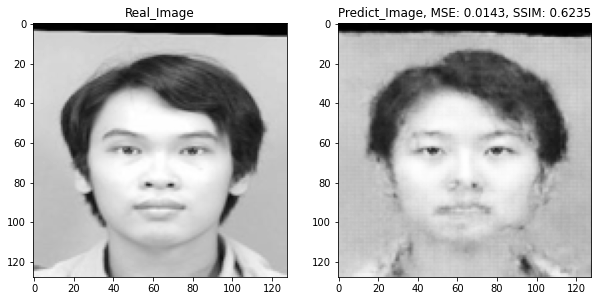

1/1 [==============================] - 0s 22ms/step


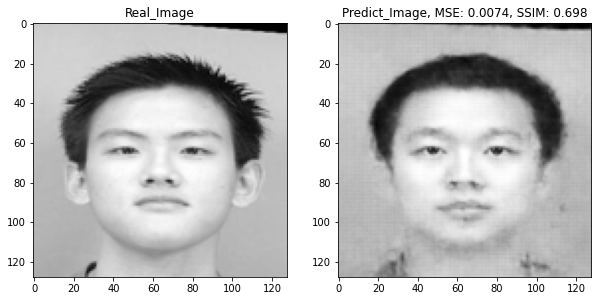

1/1 [==============================] - 0s 22ms/step


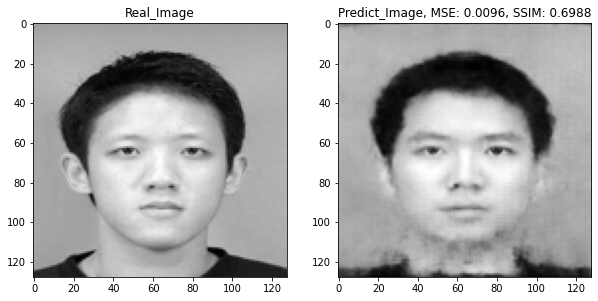

1/1 [==============================] - 0s 20ms/step


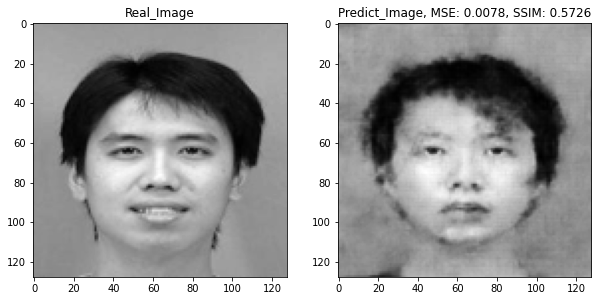

1/1 [==============================] - 0s 21ms/step


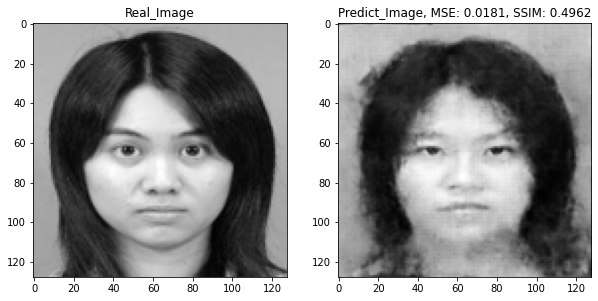

1/1 [==============================] - 0s 20ms/step


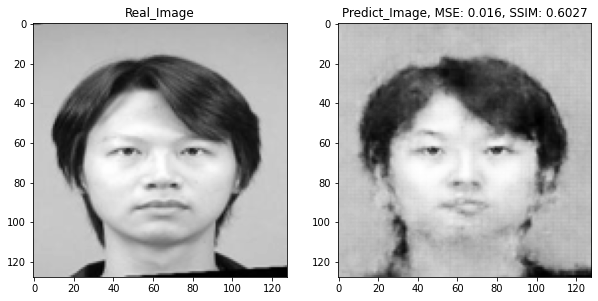

1/1 [==============================] - 0s 21ms/step


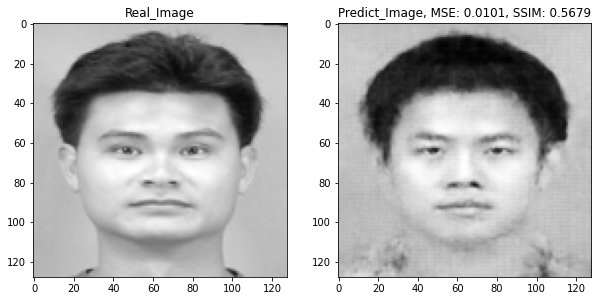

1/1 [==============================] - 0s 20ms/step


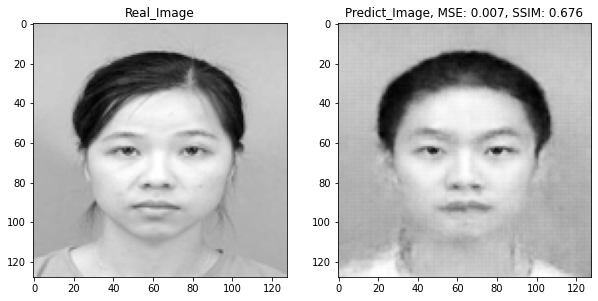

1/1 [==============================] - 0s 23ms/step


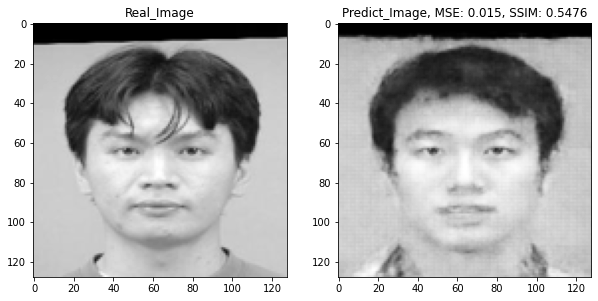

1/1 [==============================] - 0s 22ms/step


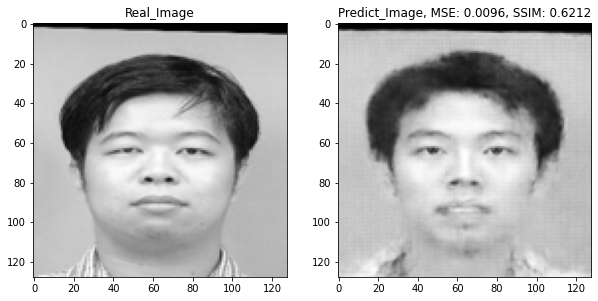

1/1 [==============================] - 0s 22ms/step


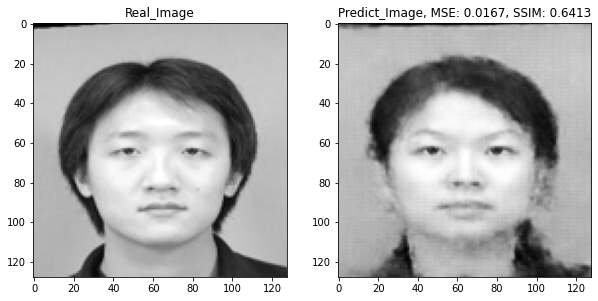

1/1 [==============================] - 0s 24ms/step


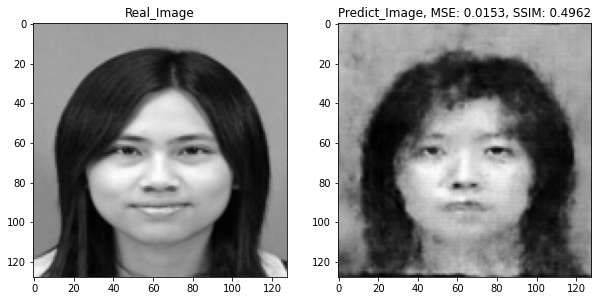

1/1 [==============================] - 0s 20ms/step


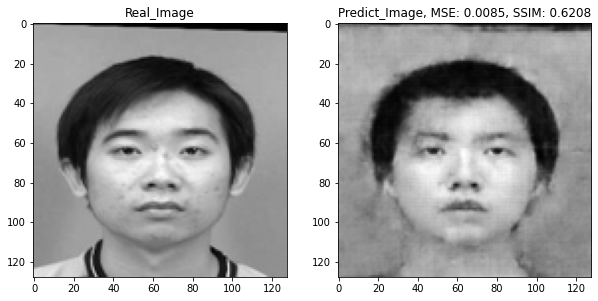

1/1 [==============================] - 0s 22ms/step


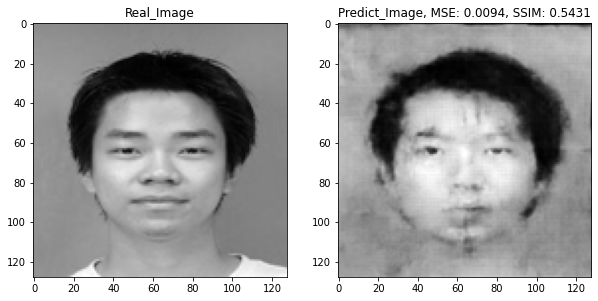

1/1 [==============================] - 0s 23ms/step


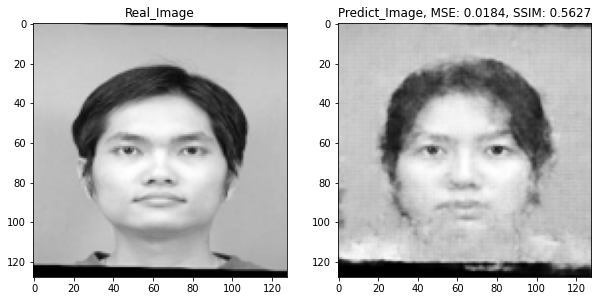

1/1 [==============================] - 0s 22ms/step


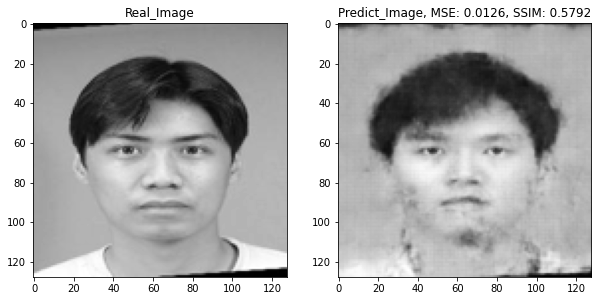

1/1 [==============================] - 0s 21ms/step


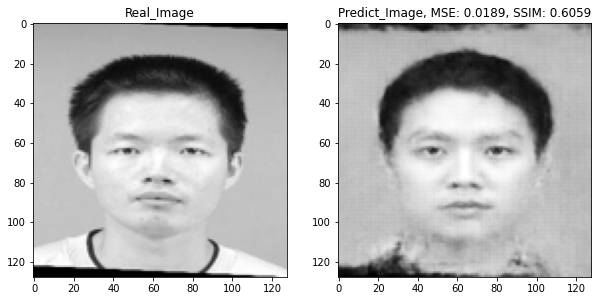

1/1 [==============================] - 0s 25ms/step


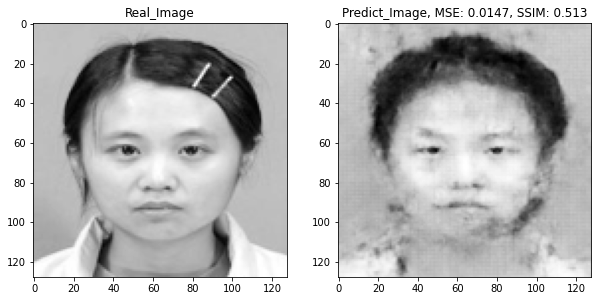

1/1 [==============================] - 0s 23ms/step


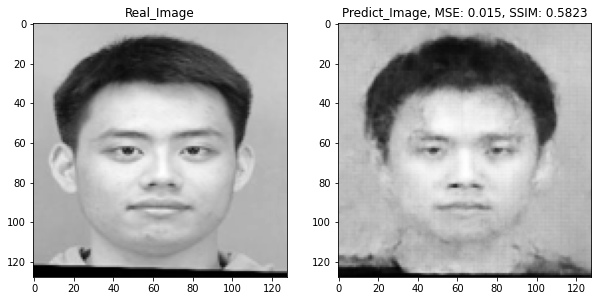

1/1 [==============================] - 0s 23ms/step


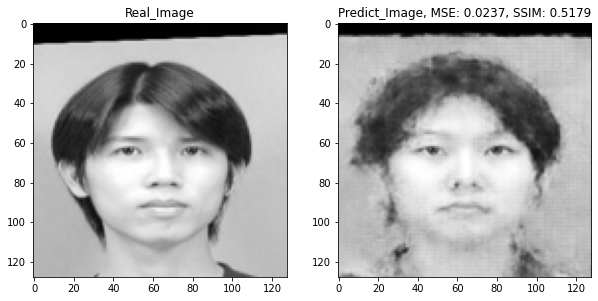

1/1 [==============================] - 0s 21ms/step


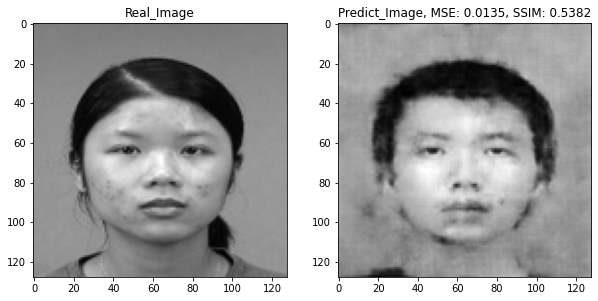

1/1 [==============================] - 0s 26ms/step


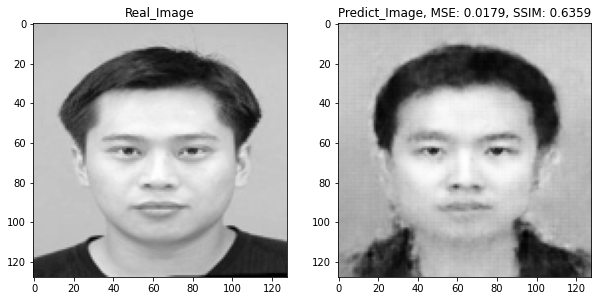

1/1 [==============================] - 0s 29ms/step


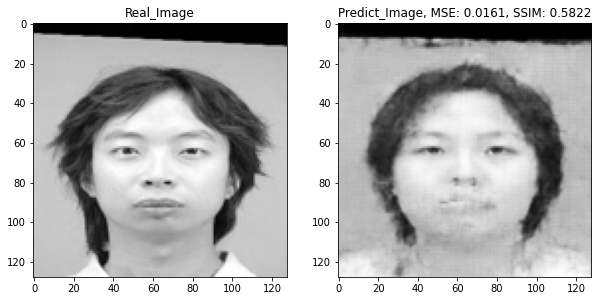

1/1 [==============================] - 0s 21ms/step


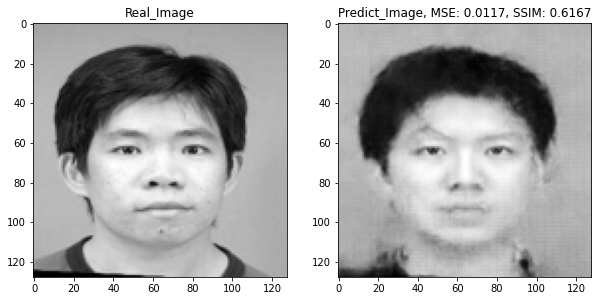

1/1 [==============================] - 0s 28ms/step


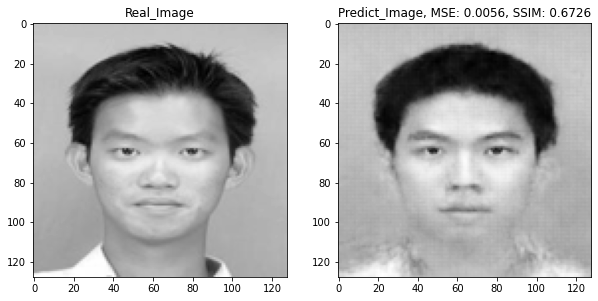

1/1 [==============================] - 0s 21ms/step


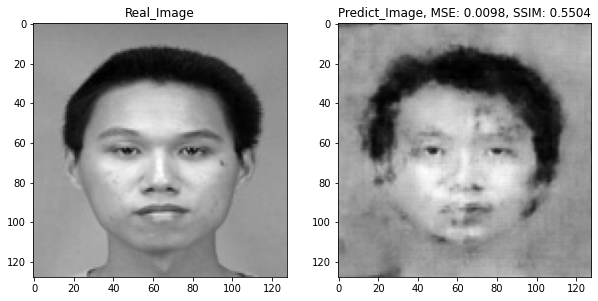

1/1 [==============================] - 0s 27ms/step


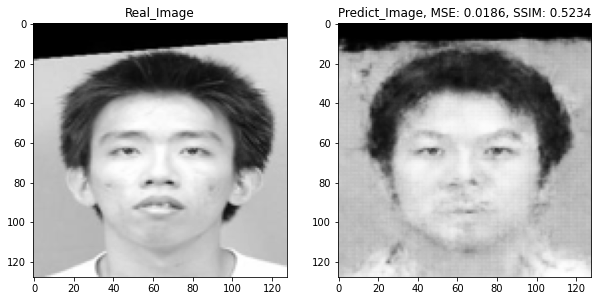

1/1 [==============================] - 0s 21ms/step


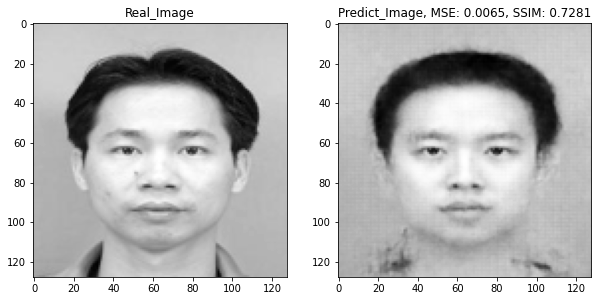

1/1 [==============================] - 0s 25ms/step


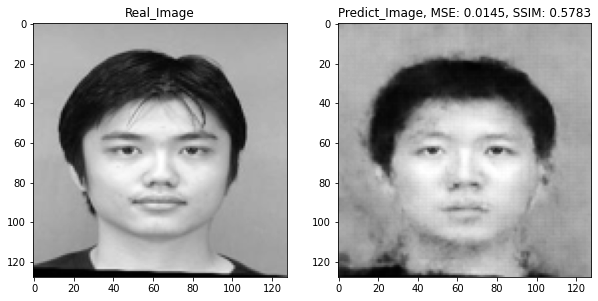

1/1 [==============================] - 0s 21ms/step


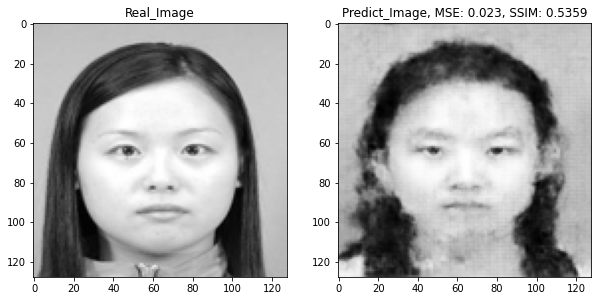

1/1 [==============================] - 0s 22ms/step


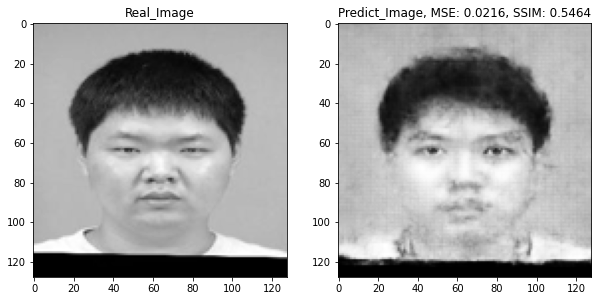

1/1 [==============================] - 0s 20ms/step


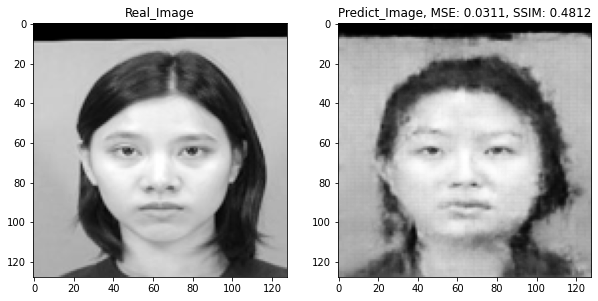

The overall MSE analysis of test dataset: Mean:0.0141, Max:0.0311, Min:0.0049
The overall SSIM analysis of test dataset: Mean:0.588, Max:0.7281, Min:0.3548


In [38]:
# Store all test cases' evaluations
MSE_all = []
SSIM_all = []
# 使用VAE模型生成素描图片
for fileName in os.listdir(filePath3):
    # 读取输入图片
    image_tmp = Image.open(os.path.join(filePath3, fileName)).convert('L')
    
    # 转换为模型的输入格式
    image_tmp = image_tmp.resize((128, 128))
    img_tmp = np.array(image_tmp).reshape((1,128,128,1)).astype('float32') / 255.

    # 使用VAE模型生成素描图片
#    z_mean,_ = encoder.predict(img_tmp)
#    sketch_img = decoder.predict(x=z_mean)
    sketch_img = preTrained_VAE.predict(img_tmp)

    # 转换为PIL Image格式并保存为文件
    sketch_img = sketch_img[0] * 255.
    #sketch_img = np.clip(sketch_img, 0, 255).astype('uint8')
    sketch_img = sketch_img.astype('uint8').reshape((*sketch_img.shape[:-1],))
    sketch_img = Image.fromarray(sketch_img)

    # Calculate MSE and SSIM of predict Image
    evaluations_tmp = imgPredictionEvaluate(realImg = image_tmp, predictImg = sketch_img)
    mse_tmp = evaluations_tmp[0]
    ssim_tmp = evaluations_tmp[1]
    MSE_all.append(mse_tmp)
    SSIM_all.append(ssim_tmp)
    # 显示生成的素描图片
    plt.figure(figsize = (10,10))
    plt.subplot(1,2,1)
    plt.title('Real_Image')
    plt.imshow(image_tmp, cmap = 'gray')
    plt.subplot(1,2,2)
    name = 'Predict_Image, MSE: {}, SSIM: {}'.format(mse_tmp, ssim_tmp)
    plt.title(name)
    plt.imshow(sketch_img, cmap = 'gray')
    plt.show()

# calculate the overall MSE & SSIM
MSE_all_Mean = round(np.mean(MSE_all), 4)
MSE_all_Max = np.max(MSE_all)
MSE_all_Min = np.min(MSE_all)

SSIM_all_Mean = round(np.mean(SSIM_all), 4)
SSIM_all_Max = np.max(SSIM_all)
SSIM_all_Min = np.min(SSIM_all) 

print('The overall MSE analysis of test dataset: Mean:{}, Max:{}, Min:{}'.format(MSE_all_Mean, MSE_all_Max, MSE_all_Min))
print('The overall SSIM analysis of test dataset: Mean:{}, Max:{}, Min:{}'.format(SSIM_all_Mean, SSIM_all_Max, SSIM_all_Min))